In [1]:
# ipython magic functions for automatic reloading coda changes in .py files
%load_ext autoreload
%autoreload 2

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
from encoder import Encoder
from decoder import Decoder
from model import ED
from net_params import convlstm_encoder_params, convlstm_decoder_params, convgru_encoder_params, convgru_decoder_params
import torch
import sys
import numpy as np
import argparse
import utils
import matplotlib.animation as animation
import numpy as np
from pylab import *
import matplotlib.gridspec as gridspec
from ConvCNN import CNNModel
import time
from data.mm import load_era5
import matplotlib.pyplot as plt 
#plt.rcParams.update({
#    'text.usetex': True})
plt.style.use('seaborn-deep')
import pandas as pd 
import seaborn as sb 

STAMP = "cnn_regr62"
save_dir = './save_model/%s/'%STAMP
data_root = '../era5/'
ani_root = './animations/'

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Use device: ", device)

class args():
    def __init__(self):
        self.frames_predict=12
        self.batch_size=8

args = args()

l,r = -2,4

Use device:  cuda:0


In [2]:
encoder_params = convlstm_encoder_params
decoder_params = convlstm_decoder_params

#encoder_params = convgru_encoder_params
#decoder_params = convgru_decoder_params

encoder = Encoder(encoder_params[0], encoder_params[1]).cuda()
decoder = Decoder(decoder_params[0], decoder_params[1]).cuda()
net = ED(encoder, decoder)

In [6]:
if torch.cuda.device_count() > 1:
    net = nn.DataParallel(net)
net.to(device)

# load model
print('==> loading existing model')
model_info = torch.load(os.path.join(save_dir, 'checkpoint.pth.tar'))
net.load_state_dict(model_info['state_dict'])
net.eval()

train_loader, val_loader, test_loader, _, _, _ = load_era5(root=data_root, args=args, channels=None, a=0.6, b=0.8, c=0.8)

==> loading existing model


In [75]:
utils.count_parameters(net)

1.616259

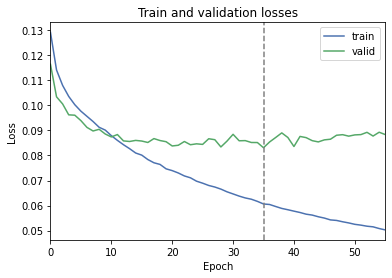

In [13]:
plt.plot(avg_train_loss, label='train')
plt.plot(avg_valid_loss, label='valid')
plt.axvline(x=np.where(avg_valid_loss==min(avg_valid_loss))[0][0],ls='--',c='grey')
plt.xlim(0, len(avg_train_loss)-1)
plt.legend()
plt.title('Train and validation losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.savefig(save_dir + 'loss_curves.pdf')
plt.show()
plt.close()

## Load inputs, targets and predictions 

In [7]:
inputs, targets, pred, _, _, _ = utils.predict_batchwise(test_loader, net, device, report=False)

In [8]:
inputs.shape, targets.shape, pred.shape

((5840, 12, 64, 64), (5840, 12, 64, 64), (5840, 12, 64, 64))

In [9]:
inputs.min(), inputs.max()

(-2.5646203, 11.799651)

In [10]:
targets.min(), targets.max()

(-2.5646203, 11.799651)

In [11]:
pred.min(), pred.max()

(-2.292899, 7.9801035)

## Accuracy report 

In [5]:
_, _, _, acc, bacc, report = utils.predict_batchwise(test_loader, net, device, report=True)

print(acc)
print(bacc)
print(report)

KeyboardInterrupt: 

## Create histogram

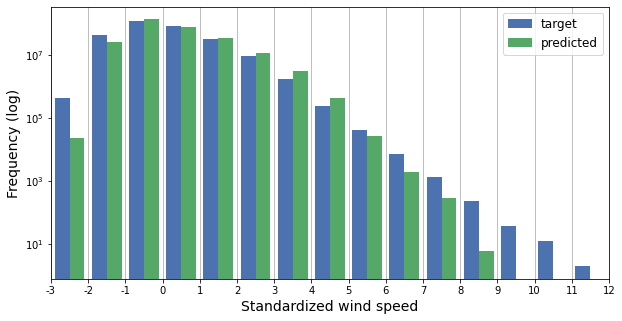

In [28]:
l,r=-3,12
plt.figure(figsize=(10,5))
plt.xlim(l,r)
n1, _, _ = plt.hist([targets.reshape(-1), pred.reshape(-1)],
                    bins=np.arange(l,r+1,1.), 
                    log=True, 
                    rwidth=0.8,
                    label = ['target','predicted'],
                    
                   )
plt.legend(loc='upper right',fontsize=12)
plt.xticks(np.arange(l,r+1),np.arange(l,r+1),fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True,axis='x')
plt.xlabel('Standardized wind speed',fontsize=14)
plt.ylabel('Frequency (log)',fontsize=14)
plt.savefig(save_dir + 'class_distribution.pdf')
plt.show()

## Example prediction

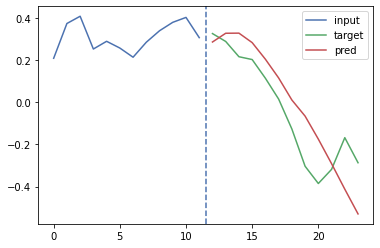

"\nplt.plot(np.arange(0,16), inputs[t,:,0,16,48], label='input')\nplt.plot(np.arange(16,32), targets[t,:,16,48], label='target')\nplt.plot(np.arange(16,32), pred[t,:,16,48], label='pred')\nplt.axvline(x=15.5,ls='--')\nplt.legend()\nplt.show()\n\nplt.plot(np.arange(0,16), inputs[t,:,0,48,16], label='input')\nplt.plot(np.arange(16,32), targets[t,:,48,16], label='target')\nplt.plot(np.arange(16,32), pred[t,:,48,16], label='pred')\nplt.axvline(x=15.5,ls='--')\nplt.legend()\nplt.show()\n\nplt.plot(np.arange(0,16), inputs[t,:,0,48,48], label='input')\nplt.plot(np.arange(16,32), targets[t,:,48,48], label='target')\nplt.plot(np.arange(16,32), pred[t,:,48,48], label='pred')\nplt.axvline(x=15.5,ls='--')\nplt.legend()\nplt.show()\n"

In [225]:
t=0
plt.plot(np.arange(0,12), inputs[t,:,8,8], label='input')
plt.plot(np.arange(12,24), targets[t,:,8,8], label='target')
plt.plot(np.arange(12,24), pred[t,:,8,8], label='pred')
plt.axvline(x=11.5,ls='--')
plt.legend()
plt.show()

In [61]:
(np.floor(pred[:,:,1-1:1+1+1,1-1:1+1+1])==1.).shape

(730, 12, 3, 3)

In [7]:
r = np.random.random(targets.shape)*6-2

r.shape, r.min(), r.max()

((2372, 12, 64, 64), -1.9999999511074853, 3.99999997946379)

In [8]:
targets.min(), targets.max()

(-2.0, 3.999999)

In [ ]:
from utils import fractions_skill_score

In [73]:
fss_mean = fractions_skill_score(pred, targets, scale=(1,1), threshold=1., categorical=True)
print(fss_mean)

0.6942047846513433


In [75]:
arr = [[fractions_skill_score(pred, targets, scale=s, threshold=t, categorical=True) for s in [(5,5),(3,3),(1,1)]] for t in [0,1,2]]

In [76]:
arr

[[0.8420219584740958, 0.8088872655264583, 0.7477829724144286],
 [0.792933329151314, 0.7578251897107824, 0.6942047846513433],
 [0.7210650859586074, 0.6902625308342293, 0.6321254373252603]]

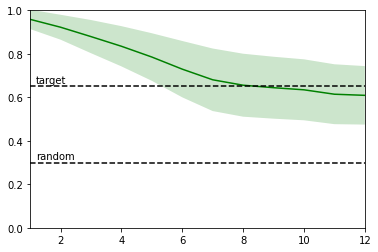

In [65]:
x = np.arange(1,len(fss_mean)+1)
y = fss_mean
error = fss_std/2
plt.plot(x, y, '-', c='green')
plt.fill_between(x, y-error, y+error,
    alpha=0.2, facecolor='green',
    linewidth=0)
plt.ylim(0,1)
plt.xlim(1,targets.shape[1])
plt.axhline(0.3,ls='--',c='black')
plt.text(x=1.2,y=0.3+0.015,s='random')
plt.axhline((1+0.3)/2,ls='--',c='black')
plt.text(x=1.2,y=(1+0.3)/2+0.015,s='target')
plt.show()

In [15]:
thresholds = [-1, -1e-6, 1e-6, 1, 2, 3]

neg_offset = 2
rand = np.random.random(targets.shape)*len(thresholds)-neg_offset
print(rand.min(), rand.max())

rand_fss = [0 for i in range(len(thresholds))]

-1.9999999931750827 3.999999999594916


In [16]:
for i, threshold in enumerate(thresholds):    
    fss_mean, fss_std = fractions_skill_score(rand, targets, scale=(3,3), threshold=threshold)

    #plt.plot(np.arange(len(fss)), fss, '.')
    #plt.ylim(0,1)
    #plt.show()
    print(np.mean(fss_mean))
    #print(np.mean(fss_std))
    rand_fss[i] = np.mean(fss_mean)

0.273966325943574
0.5422335602574376
0.6457377204853048
0.3451216809025661
0.12942078133702137
0.03307244495360801


In [18]:
# local -2,4
rand_fss = [0.27387186355259213,
0.5421915152384361,
0.6453223252162856,
0.3433160385802622,
0.12974408284257347,
0.0353748317539469]

In [14]:
# climate -2,4
rand_fss = [0.273966325943574,
0.5422335602574376,
0.6457377204853048,
0.3451216809025661,
0.12942078133702137,
0.03307244495360801]

In [17]:
def plot_fss(pred, targets, thresholds, rand, offset):
    """offset >= 1"""
    scales = [(15,15), (9,9), (3,3)]
    
    #fss = fractions_skill_score(pred, targets, scale=(3,3), threshold=2.)
    #print(fss)
    #fig, big_axes = plt.subplots(figsize=(5*len(thresholds),5),nrows=1, ncols=len(thresholds)) 
    #fig.suptitle('', fontsize=16)
    
    fig, axes = plt.subplots(figsize=(5*len(thresholds),8),nrows=1, ncols=len(thresholds), sharex=True, sharey=True)
    # add a big axis, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axis
    plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
    plt.xlabel("Forecast time (hours)", fontsize=12)
    plt.ylabel("Fractions Skill Score", fontsize=12)
    
    col = plt.cm.Set1(range(len(thresholds))) 
    
    for i, threshold in enumerate(thresholds):
        print(threshold)
        ax = axes[i]
        ax.axhline(rand[i],ls='--',c='black')
        ax.text(x=1.2,y=rand[i]+0.015,s='random')
        ax.axhline((1+rand[i])/2,ls='--',c='black')
        ax.text(x=1.2,y=(1+rand[i])/2+0.015,s='target')
        ax.set_ylim(0,1)
        ax.set_xlim(1,targets.shape[1])
        ax.grid(True,axis='both')
        for j,scale in enumerate(scales): 
            fss_mean, fss_std = fractions_skill_score(pred, targets, scale=scale, threshold=threshold)
            ax.plot(np.arange(1, len(fss_mean)+1), fss_mean, label=scale, c=col[j])
            #error = fss_std/2
            #ax.fill_between(np.arange(1, len(fss_mean)+1), fss_mean-error, fss_mean+error,
            #    alpha=0.2, facecolor=col[j],
            #    linewidth=0)
        ax.legend()    
        if i == offset-1: 
            ax.set_title(r'Threshold = $0.0_-$')
        elif i == offset:
            ax.set_title(r'Threshold = $0.0_+$')
        else:
            ax.set_title('Threshold = %s'%threshold)
        #ax.set_xlabel('Hours after analysis')
        #ax.set_ylabel('Fractions skill score')

-1


KeyboardInterrupt: 

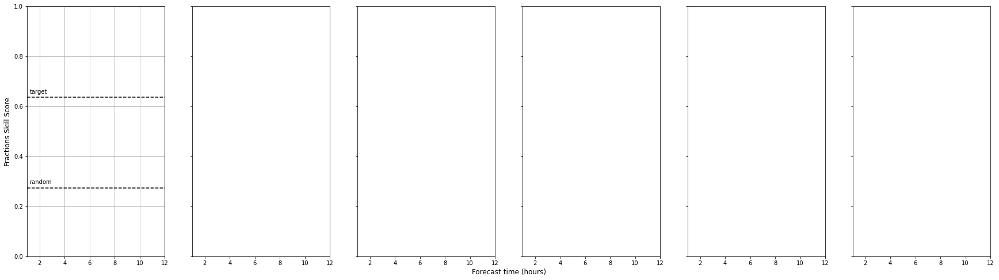

In [19]:
plot_fss(pred, targets, thresholds, rand_fss, neg_offset)

## Categorical

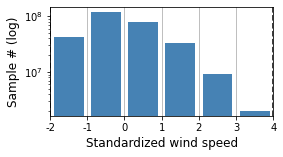

In [469]:
plt.figure(figsize=(4,2))
plt.xlim(l,r)
n, _, _ = plt.hist(targets.reshape(-1), bins=np.arange(l,r+1,1), log=True, rwidth=0.8, color='steelblue')
plt.xticks(np.arange(l,r+1),np.arange(l,r+1))
plt.grid(True,axis='x')
plt.xlabel('Standardized wind speed',fontsize=12)
plt.ylabel('Sample # (log)',fontsize=12)
#plt.savefig(data_root+'class_distribution.png')
plt.axvline(x=-2,ls='--',color='black')
plt.axvline(x=4,ls='--',color='black')
#plt.axis('off')
plt.show()

In [470]:
rand = n/sum(n)

In [317]:
scales = [(15,15),(13,13),(11,11),(9,9),(7,7),(5,5),(3,3),(1,1)]
thresholds = [-2, -1, 0, 1, 2, 3]

In [482]:
fss_scores = np.zeros((len(thresholds),len(scales),args.frames_predict))

for i, threshold in enumerate(thresholds):
    print(threshold)
    for j, scale in enumerate(scales): 
        fss_mean = fractions_skill_score(pred, targets, scale=scale, threshold=threshold, categorical=True)
        fss_scores[i][j][:] = fss_mean[:]

In [472]:
km_scales = [s[0]*111/4 for s in scales]
print(km_scales)
km_scales_rounded = [int(np.round(s,-1)) for s in km_scales]
print(km_scales_rounded)

[416.25, 360.75, 305.25, 249.75, 194.25, 138.75, 83.25, 27.75]
[420, 360, 310, 250, 190, 140, 80, 30]


In [489]:
def plot_fss(scores, random, thresholds, scales, args):
    fig, axes = plt.subplots(figsize=(10,10),nrows=2, ncols=3, sharex=True, sharey=True)
    # add a big axis, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axis
    plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
    plt.xlabel("Forecast time (hours)", fontsize=14,labelpad=10)
    plt.ylabel("Categorized Fractions Skill Score", fontsize=14,labelpad=10)
    
    #col = matplotlib.cm.get_cmap('hsv_r')(np.linspace(0.5,1.,len(scales))) 
    col = matplotlib.cm.get_cmap('jet')(np.linspace(0.3,1.,len(scales))) 
    
    for i, threshold in enumerate(thresholds):
        ax_pos = [(0,0),(0,1),(0,2),(1,0),(1,1),(1,2)][i]
        ax = axes[ax_pos]
        ax.axhline(random[i],ls='--',c='black')
        ax.text(x=1.2,y=random[i]+0.015,s='random')
        ax.axhline((1+random[i])/2,ls='--',c='black')
        ax.text(x=1.2,y=(1+random[i])/2+0.015,s='target')
        ax.set_ylim(0,1)
        ax.set_xlim(1,args.frames_predict)
        ax.set_xticks(range(1,args.frames_predict+1))
        ax.grid(True,axis='both')
        ax.set_title('Category %s'%threshold, fontsize=12)
        for j, scale in enumerate(scales): 
            ax.plot(np.arange(1, args.frames_predict+1), scores[i][j], label=km_scales_rounded[j], c=col[j], alpha=0.5)
            #error = fss_std/2
            #ax.fill_between(np.arange(1, len(fss_mean)+1), fss_mean-error, fss_mean+error,
            #    alpha=0.2, facecolor=col[j],
            #    linewidth=0)
        if i==2:
            legend=ax.legend(loc='upper right',title="Scale (km)",fontsize=12,bbox_to_anchor=(1.65, 1.01))  
            legend.get_title().set_fontsize('12') #legend 'Title' fontsize
    plt.tight_layout()
    plt.show()

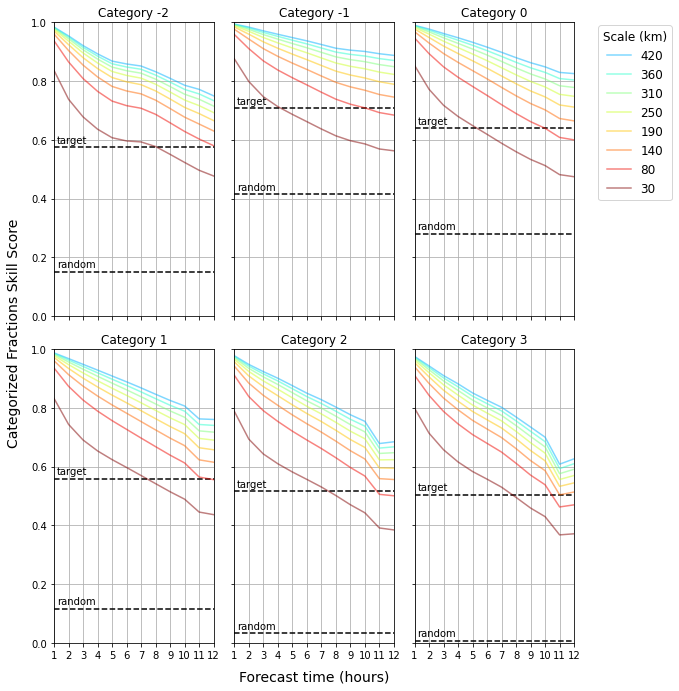

In [490]:
plot_fss(fss_scores, rand, thresholds, scales, args)

In [475]:
fss_time_avg = np.zeros((len(thresholds),len(scales)))
for i, t in enumerate(thresholds): 
    print(t)
    fss_time_avg[i,:] = [fractions_skill_score(pred, targets, scale=s, threshold=t, categorical=True, time_comp=False) for s in scales]

-2
-1
0
1
2
3


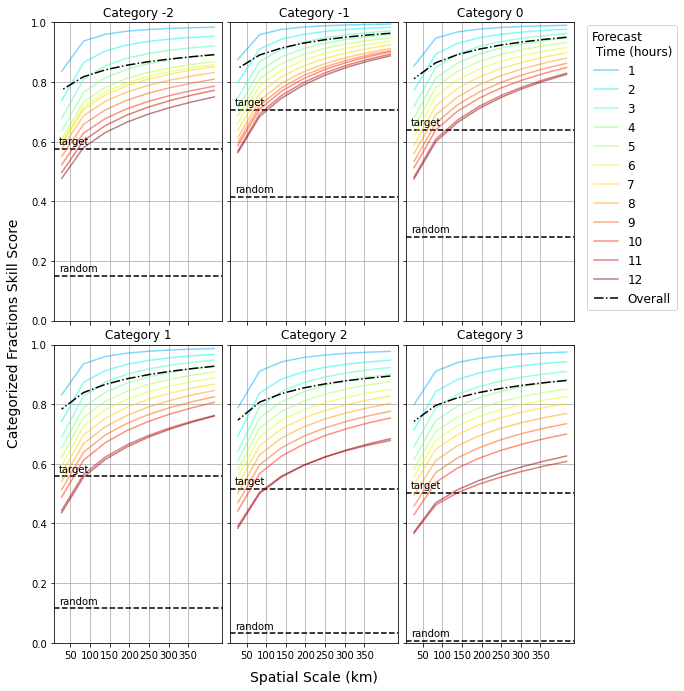

In [492]:
fig, axes = plt.subplots(figsize=(10,10),nrows=2, ncols=3, sharex=True, sharey=True)
# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel("Spatial Scale (km)", fontsize=14,labelpad=10)
plt.ylabel("Categorized Fractions Skill Score", fontsize=14,labelpad=10)

#col = matplotlib.cm.get_cmap('hsv_r')(np.linspace(0.5,1.,len(scales))) 
col = matplotlib.cm.get_cmap('jet')(np.linspace(0.3,1.,args.frames_predict)) 

for i, threshold in enumerate(thresholds):
    ax_pos = [(0,0),(0,1),(0,2),(1,0),(1,1),(1,2)][i]
    ax = axes[ax_pos]
    ax.axhline(rand[i],ls='--',c='black')
    ax.text(x=20,y=rand[i]+0.015,s='random')
    ax.axhline((1+rand[i])/2,ls='--',c='black')
    ax.text(x=20,y=(1+rand[i])/2+0.015,s='target')
    ax.set_ylim(0,1)
    #ax.set_xlim(,args.frames_predict)
    ax.set_xticks(range(0,400,50))
    ax.grid(True,axis='both')
    ax.set_title('Category %s'%threshold, fontsize=12)
    for t in range(0,args.frames_predict): 
        ax.plot(km_scales, fss_scores[i,:,t], label=range(1,args.frames_predict+1)[t], alpha=0.5, c=col[t])
        #error = fss_std/2
        #ax.fill_between(np.arange(1, len(fss_mean)+1), fss_mean-error, fss_mean+error,
        #    alpha=0.2, facecolor=col[j],
        #    linewidth=0)
    ax.plot(km_scales, fss_time_avg[i,:], label='Overall',color='black',ls='-.')
    if i==2:
        legend=ax.legend(loc='upper right',title="Forecast\n Time (hours)",fontsize=12,bbox_to_anchor=(1.65, 1.01))  
        legend.get_title().set_fontsize('12') #legend 'Title' fontsize
        
plt.tight_layout()

plt.subplots_adjust(#left=0.01,
                #bottom=0.01, 
                #right=0.99, 
                #top=0.99, 
                wspace=0.05,
                hspace=0.08)

plt.show()

### Only extreme category

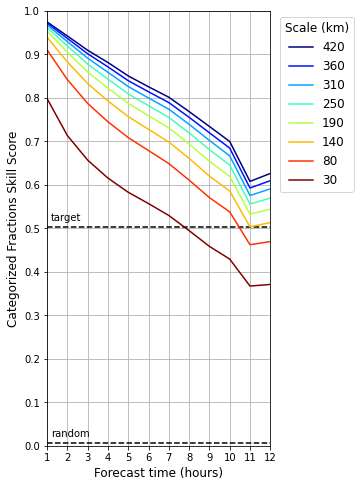

In [477]:
fig = plt.figure(figsize=(4,8))

plt.xlabel("Forecast time (hours)", fontsize=12)
plt.ylabel("Categorized Fractions Skill Score", fontsize=12)

#col = matplotlib.cm.get_cmap('hsv_r')(np.linspace(0.5,1.,len(scales))) 
col = matplotlib.cm.get_cmap('jet')(np.linspace(0.,1.,len(scales))) 

plt.axhline(rand[-1],ls='--',c='black')
plt.text(x=1.2,y=rand[-1]+0.015,s='random')
plt.axhline((1+rand[-1])/2,ls='--',c='black')
plt.text(x=1.2,y=(1+rand[-1])/2+0.015,s='target')
plt.ylim(0,1)
plt.xlim(1,args.frames_predict)
plt.xticks(range(1,args.frames_predict+1))
plt.yticks(np.arange(0,1.1,0.1))
plt.grid(True,axis='both')
#plt.title('Category %s'%threshold, fontsize=14)
for j, scale in enumerate(scales): 
    plt.plot(np.arange(1, args.frames_predict+1), fss_scores[-1][j], label=km_scales_rounded[j], c=col[j])

legend=plt.legend(loc='upper right',title="Scale (km)",fontsize=12,bbox_to_anchor=(1.4, 1.0))  
legend.get_title().set_fontsize('12') #legend 'Title' fontsize

plt.show()

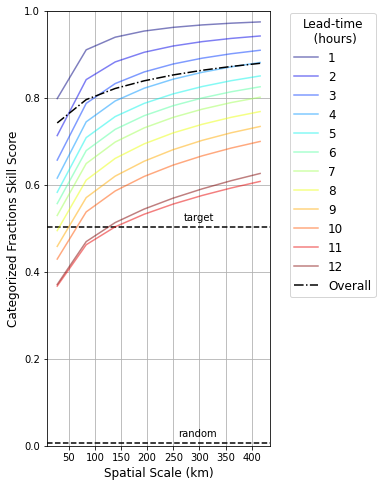

In [498]:
fig = plt.figure(figsize=(4,8))

plt.xlabel("Spatial Scale (km)", fontsize=12)
plt.ylabel("Categorized Fractions Skill Score", fontsize=12)

#col = matplotlib.cm.get_cmap('hsv_r')(np.linspace(0.5,1.,len(scales))) 
col = matplotlib.cm.get_cmap('jet')(np.linspace(0.,1.,args.frames_predict)) 

plt.axhline(rand[-1],ls='--',c='black')
plt.text(x=260,y=rand[-1]+0.015,s='random')
plt.axhline((1+rand[-1])/2,ls='--',c='black')
plt.text(x=270,y=(1+rand[-1])/2+0.015,s='target')
plt.ylim(0,1)
#plt.xlim(,args.frames_predict)
plt.xticks(range(0,500,50))
plt.grid(True,axis='both')
#plt.title('Category %s'%threshold, fontsize=12)
for t in range(0,args.frames_predict): 
    plt.plot(km_scales, fss_scores[-1,:,t], label=range(1,args.frames_predict+1)[t], c=col[t], alpha=0.5)

plt.plot(km_scales, fss_time_avg[-1], label='Overall', c='black',ls='-.')
    
legend=plt.legend(loc='upper right',title="Lead-time\n   (hours)",fontsize=12,bbox_to_anchor=(1.5, 1.01))  
legend.get_title().set_fontsize('12') #legend 'Title' fontsize
#plt.axvline(30,ls='--')
plt.show()

In [ ]:
#30,30,30,30,30,40,60,90,140,180,300+,300+

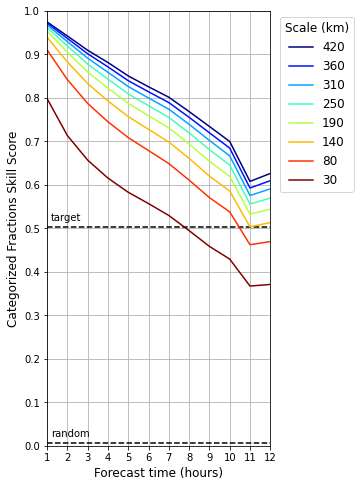

In [479]:
fig = plt.figure(figsize=(4,8))

plt.xlabel("Forecast time (hours)", fontsize=12)
plt.ylabel("Categorized Fractions Skill Score", fontsize=12)

#col = matplotlib.cm.get_cmap('hsv_r')(np.linspace(0.5,1.,len(scales))) 
col = matplotlib.cm.get_cmap('jet')(np.linspace(0.,1.,len(scales))) 

plt.axhline(rand[-1],ls='--',c='black')
plt.text(x=1.2,y=rand[-1]+0.015,s='random')
plt.axhline((1+rand[-1])/2,ls='--',c='black')
plt.text(x=1.2,y=(1+rand[-1])/2+0.015,s='target')
plt.ylim(0,1)
plt.xlim(1,args.frames_predict)
plt.xticks(range(1,args.frames_predict+1))
plt.yticks(np.arange(0,1.1,0.1))
plt.grid(True,axis='both')
#plt.title('Category %s'%threshold, fontsize=14)
for j, scale in enumerate(scales): 
    plt.plot(np.arange(1, args.frames_predict+1), fss_scores[-1][j], label=km_scales_rounded[j], c=col[j])

legend=plt.legend(loc='upper right',title="Scale (km)",fontsize=12,bbox_to_anchor=(1.4, 1.0))  
legend.get_title().set_fontsize('12') #legend 'Title' fontsize

plt.show()

### Intensity Scale Diagram

In [484]:
#thresholds = [-2, -1, 0, 1, 2, 3]
#scales = [(11,11),(9,9),(7,7),(5,5),(3,3),(1,1)]

df = pd.DataFrame(np.zeros((len(scales),len(thresholds))),index=scales, columns=thresholds, dtype=float)

for i, s in enumerate(scales): 
    #print(s)
    #t0 = time.time()
    #res = [fractions_skill_score(pred, targets, scale=s, threshold=t, categorical=True) for t in thresholds]
    df.iloc[i]=fss_time_avg[:,i] 
    #print(time.time()-t0)

In [485]:
df 

df2 = df.set_axis(km_scales_rounded, axis=0)
df2

,-2,-1,0,1,2,3
420,0.891648,0.963618,0.950210,0.927130,0.894291,0.879520
360,0.885159,0.957979,0.943245,0.919482,0.887271,0.872273
310,0.877573,0.950957,0.934744,0.910385,0.878727,0.863506
250,0.868348,0.941982,0.924130,0.899283,0.868078,0.852778
190,0.856576,0.930174,0.910402,0.885190,0.854285,0.839303
140,0.840787,0.914117,0.891886,0.866362,0.835421,0.821654
80,0.817838,0.890740,0.864808,0.838891,0.806902,0.796060
30,0.773549,0.845669,0.811155,0.783686,0.746537,0.742414


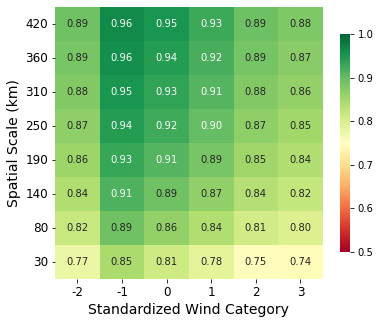

In [486]:
fig, ax = plt.subplots(figsize=(6, 5))

# plot heatmap
sb.heatmap(df2, annot=True, fmt=".2f", cmap='RdYlGn' ,
           vmin=0.5, vmax=1, cbar_kws={"shrink": .8})
#plt.title('Categorized Fractions Skill Score', fontsize=16)
plt.xlabel('Standardized Wind Category', fontsize=14)
plt.ylabel('Spatial Scale (km)',fontsize=14)
# yticks
plt.yticks(rotation=0, fontsize=12)
plt.xticks(fontsize=12)

plt.show()

## Intensity-Scale (Casati)

In [335]:
scales = ((64,64),(32,32),(16,16),(8,8),(4,4),(2,2),(1,1))
thresholds = [-2,-1,0,1,2,3]

km_scales = [s[0]*111/4 for s in scales]
print(km_scales)
km_scales_rounded = [int(np.round(s,0)) for s in km_scales]
print(km_scales_rounded)

[1776.0, 888.0, 444.0, 222.0, 111.0, 55.5, 27.75]
[1776, 888, 444, 222, 111, 56, 28]


In [320]:
IS = utils.compute_IS(targets[:500], pred[:500], thresholds)

-2
-1
0
1
2
3


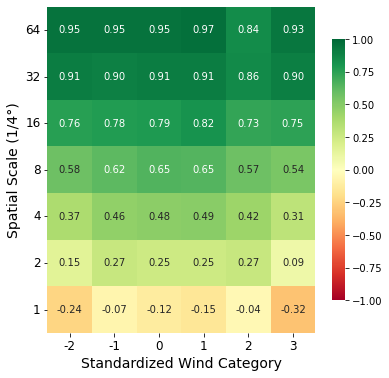

In [344]:
df = pd.DataFrame(np.zeros((len(scales),len(thresholds))),index=scales, columns=thresholds, dtype=float)
#df = df.set_axis(km_scales_rounded, axis=0)
df = df.set_axis([64,32,16,8,4,2,1], axis=0)
#df = df.set_axis(['[%s,%s)'%(t,t+1) for t in thresholds], axis=1)

for i, s in enumerate(scales): 
    df.iloc[i]=IS[i] 
    
fig, ax = plt.subplots(figsize=(6,6))

# plot heatmap
sb.heatmap(df, annot=True, fmt=".2f", cmap='RdYlGn' ,
           vmin=-1, vmax=1, cbar_kws={"shrink": .8})
#plt.title('Categorized Fractions Skill Score', fontsize=16)
plt.xlabel('Standardized Wind Category', fontsize=14)
plt.ylabel('Spatial Scale (1/4°)',fontsize=14)
# yticks
plt.yticks(rotation=0, fontsize=12)
plt.xticks(fontsize=12)

plt.show()

## Animate Standardization

In [20]:
def animate_side_by_side(data1, data2, title='', filename='side_by_side'):
    
    num_images = len(data1)
    fps = 5 
    print('animation time:',num_images/fps,'sec.')
    
    dpi = 100
    
    fig = plt.figure()

    ax1 = fig.add_subplot(121)
    ax1.set_aspect('equal')
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    ax1.set_title('Raw')
    im1 = ax1.imshow(data1[0], cmap='plasma', vmin=data1.min(), vmax=data1.max())
    
    ax2 = fig.add_subplot(122)
    ax2.set_aspect('equal')
    ax2.get_xaxis().set_visible(False)
    ax2.get_yaxis().set_visible(False)
    ax2.set_title('Local Standardization')
    im2 = ax2.imshow(data2[0], cmap='plasma', vmin=data2.min(), vmax=data2.max())
    
    fig.suptitle(title, y=0.82)

    #im.set_clim([0,1])
    fig.set_size_inches([8,8])

    tight_layout()


    def update_img(n):
        tmp1 = data1[n]
        im1.set_data(tmp1)
        tmp2 = data2[n]
        im2.set_data(tmp2)
        return im1, im2

    #legend(loc=0)
    ani = animation.FuncAnimation(fig,update_img,num_images,interval=1000/fps)
    writer = animation.writers['ffmpeg'](fps=fps)

    ani.save(ani_root+filename+'.mp4',writer=writer,dpi=dpi)
    return ani


In [ ]:
title_list = [
        'Horizontal_velocity',
        'Divergence',
        'Geopotential',
        'Potential_vorticity',
        'Temperature',
        'Vertical_velocity',
        'Vorticity_relative']

In [ ]:
animate_side_by_side(data1[:,0], data2[:,0], title=title_list[0], filename='c%s'%0)

In [ ]:
for i in range(1,7):
    animate_side_by_side(data1[:,i], data2[:,i], title=title_list[i], filename='c%s'%i)

## Data Imbalances 

In [56]:
def standardize_local(data):
    zvals = []
    m = data.mean(0)
    s = data.std(0)
    zvals.append([m,s])
    for j in range(len(data)):
        data[j] = (data[j] - m)/s
    return data, zvals
    
def standardize_climate(data):
    zvals = []
    for i in range(365*24):
        indices = range(i,data.shape[0],365*8)
        m = data[indices].mean(0)
        s = data[indices].std(0)
        zvals.append([m,s])
        data[indices] = (data[indices] - m)/s
    
    return data, zvals

In [57]:
data = np.load('../era5/adaptor.mars.internal-Horizontal_velocity.npy')[:24*365*40]

print('data shape:',data.shape)
print(data.min(), data.max())

# plt.figure(figsize=(30,10))
# for yr in range(39):
#     plt.scatter(np.arange(365*8), data[yr*365*8:(yr+1)*365*8,0,0,0], marker='o', c='blue', alpha=0.05)
# #plt.savefig('era5/climatology.png')
# plt.show()
# plt.close()

data, zvals = standardize_local(data)

print(data.min(), data.max())

# plt.figure(figsize=(30,10))
# for yr in range(39):
#     plt.scatter(np.arange(365*8), data[yr*365*8:(yr+1)*365*8,0,0,0], marker='o', c='blue', alpha=0.1)
# #plt.savefig('era5/climatology_standardized.png')
# plt.show()
# plt.close()

#np.save('era5/zvals_global.npy', np.array(zvals))

data shape: (350400, 64, 64)
0.00011108566115235165 32.160835348733976
-2.5646203059403474 13.66899241488353


In [50]:
l,r = -2,4 

data[data>=r]=r-1e-6
data[data<l]=l

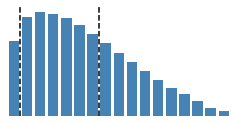

In [59]:
l,r=-3,14
plt.figure(figsize=(4,2))
plt.xlim(l,r)
n, _, _ = plt.hist(data.reshape(-1), bins=np.arange(l,r+1,1), log=True, rwidth=0.8, color='steelblue')
plt.xticks(np.arange(l,r+1),np.arange(l,r+1))
plt.grid(True,axis='x')
plt.xlabel('Standardized wind speed',fontsize=12)
plt.ylabel('Sample # (log)',fontsize=12)
#plt.savefig(data_root+'class_distribution.png')
plt.axvline(x=-2,ls='--',color='black')
plt.axvline(x=4,ls='--',color='black')
plt.axis('off')
plt.show()

In [60]:
n, len(n),

(array([2.12080100e+06, 2.10910113e+08, 5.88460958e+08, 4.05949736e+08,
        1.70337996e+08, 4.68667520e+07, 8.92054100e+06, 1.40687100e+06,
        2.20305000e+05, 3.61590000e+04, 6.58600000e+03, 1.22400000e+03,
        2.44000000e+02, 8.40000000e+01, 2.20000000e+01, 5.00000000e+00,
        3.00000000e+00]),
 17)

/home/daan/miniconda3/envs/deep/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:1678: RuntimeWarning: invalid value encountered in add
  logp = (np.log(a) + np.log(c) + sc.xlogy(a - 1.0, exm1c) +


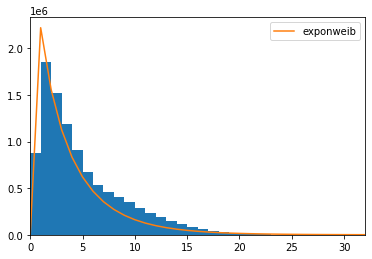

In [147]:
import scipy 

y = data.reshape(-1)[:10000000]
size = len(y)
x = np.arange(size)
                 
h = plt.hist(y, bins=range(32))

dist_names = ['exponweib']

for dist_name in dist_names:
    dist = getattr(scipy.stats, dist_name)
    params = dist.fit(y)
    arg = params[:-2]
    loc = params[-2]
    scale = params[-1]
    if arg:
        pdf_fitted = dist.pdf(x, *arg, loc=loc, scale=scale) * size
    else:
        pdf_fitted = dist.pdf(x, loc=loc, scale=scale) * size
    plt.plot(pdf_fitted, label=dist_name)
    plt.xlim(0,32)
plt.legend(loc='upper right')
plt.show()

In [61]:
[i*100/sum(n) for i in n]

[0.1477664616554295,
 14.69512751331068,
 41.000920683281606,
 28.284481240189784,
 11.868271919145975,
 3.2654332548515983,
 0.6215372303305151,
 0.09802350606003853,
 0.015349714723351884,
 0.002519372391374144,
 0.0004588784692494292,
 8.528199914383562e-05,
 1.700065996004566e-05,
 5.852686215753424e-06,
 1.5328463898401826e-06,
 3.483741795091324e-07,
 2.0902450770547944e-07]

In [352]:
sum([0.6176905523152112,
 0.09370540810502283,
 0.0131454119399258,
 0.0019127135951769406,
 0.00028984731735159816,
 4.3477097602739724e-05,
 7.803581621004566e-06,
 1.3934967180365296e-06])

0.7267966074486302

In [53]:
print('Category:  Percent:')
for i,cat in enumerate([-2, -1, 0, 1, 2, 3]):
    print(f'{cat}\t   {n[i]*100/sum(n):.2f}')

Category:  Percent:
-2	   14.96
-1	   40.82
0	   28.25
1	   11.95
2	   3.31
3	   0.71


In [10]:
41.01037852153128/0.6207366110125142

66.06727844622733

In [49]:
targets = np.load('../era5/chunked_targets.npy')

In [50]:
targets.max(axis=(1,2,3)).min(), targets.max(axis=(1,2,3)).max()

(1.5015510764008249, 5.823950553815503)

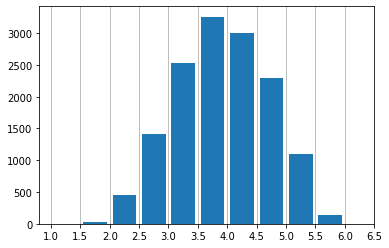

In [54]:
plt.hist(targets.max(axis=(1,2,3)), bins=np.arange(1.,6.5,0.5), rwidth=0.8)
plt.xticks(np.arange(1,7,0.5),np.arange(1,7,0.5))
plt.grid(True,axis='x')
plt.show()

In [64]:
#weights = 1/np.sqrt(n)
weights = 1/n 
weights

array([4.71519959e-07, 4.74135633e-09, 1.69934808e-09, 2.46335916e-09,
       5.87068078e-09, 2.13370878e-08, 1.12100824e-07, 7.10797223e-07,
       4.53916162e-06, 2.76556321e-05, 1.51837230e-04, 8.16993464e-04,
       4.09836066e-03, 1.19047619e-02, 4.54545455e-02, 2.00000000e-01,
       3.33333333e-01])

In [63]:
scaling = len(weights) / np.sum(weights)
weights = scaling*weights
weights

array([1.34540595e-05, 1.35286936e-07, 4.84881495e-08, 7.02879701e-08,
       1.67510383e-07, 6.08819295e-07, 3.19861575e-06, 2.02814493e-05,
       1.29517636e-04, 7.89108739e-04, 4.33242984e-03, 2.33115873e-02,
       1.16940094e-01, 3.39683130e-01, 1.29697195e+00, 5.70667658e+00,
       9.51112764e+00])

In [67]:
for i in weights:
    print(f'{i/min(weights):.2f}')

277.47
2.79
1.00
1.45
3.45
12.56
65.97
418.28
2671.12
16274.26
89350.28
480768.76
2411725.24
7005487.60
26748225.36
117692191.60
196153652.67


In [28]:
del targets, data 

In [36]:
n = np.array([7.18022000e+05+6.83751270e+07, 1.91546235e+08, 1.31785833e+08,
        5.53400630e+07, 1.52335010e+07, 3.45369900e+06])

for i in range(1,len(n)):
    print(n[i-1]/n[i])

0.36071264465208625
1.453466056552528
2.3813820558896004
3.632786908275386
4.4107784146794495


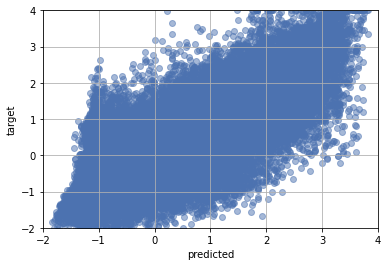

In [15]:
plt.scatter(pred.reshape(-1)[:100000],targets.reshape(-1)[:100000],alpha=0.5)
plt.xlim(-2,4)
plt.ylim(-2,4)
plt.grid(True)
plt.xlabel('predicted')
plt.ylabel('target')
plt.show()

### Accuracy and mean error per class

In [23]:
#64x64 local 
#n = [2.60254506e+08, 1.32185797e+08, 5.53752420e+07, 1.51761210e+07, 3.46081400e+06]
n = [2.23753355e+08, 6.18469998e+08, 4.26489901e+08, 1.79017872e+08, 4.92200650e+07, 1.11304730e+07]
#n = [6.83582000e+05, 6.86879320e+07, 1.90882992e+08, 1.32185797e+08, 5.53752420e+07, 1.51761210e+07, 3.46081400e+06]

#64x64 climate 
#n = [7.25600500e+07, 1.81593515e+08, 1.35740806e+08, 5.98004560e+07, 1.45538510e+07, 2.20380200e+06]


#16x16 local
#n = [44356.,  4045719., 12358824.,  8241861.,  3297805.,   885624., 279091.]
#n = [4045719., 12358824.,  8241861.,  3297805.,   885624., 279091.]

#16x16 climate
#n = [4183717., 12151852.,  8194936.,  3453162.,   946968.,   222645.]

In [8]:
climat = utils.get_climatology()

In [9]:
climat.shape

(5840, 12, 64, 64)

In [505]:
error_scores = utils.error_per_cat(test_loader, net, device)

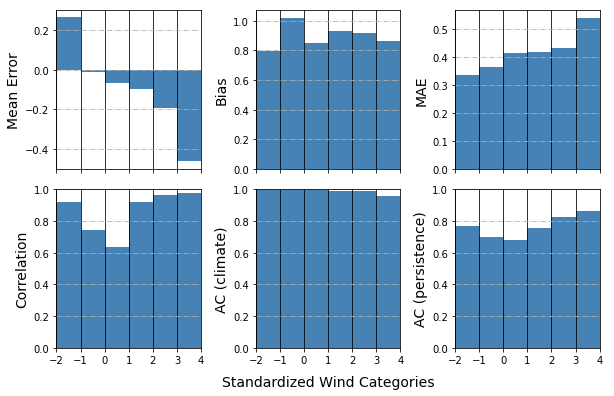

In [506]:
# error scores 

title = ''
labels = ['Mean Error', 'Bias', 'MAE','Correlation','AC (climate)','AC (persistence)']

fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(9,6))
fig.suptitle(title, fontsize=16)
# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel("Standardized Wind Categories", fontsize=14, labelpad=10)

for i, a in enumerate([(0,0),(0,1),(0,2),(1,0),(1,1),(1,2)]):
    ax = axes[a]
    ax.set_xlim(l,r)
    ax.set_xticks(np.arange(l,r+1))
    if i>=3:
        ax.set_ylim(0,1)
    #vals = [np.array(list(error_scores[i][cat].values())).mean() for cat in error_scores[i].keys()]
    vals = error_scores[i].values()
    ax.bar(error_scores[i].keys(), vals, align='edge',width=1.,log=False, color='steelblue')
    ax.grid(True,axis='x',color='black')
    ax.grid(True,axis='y',ls='-.')
    ax.set_ylabel(labels[i],fontsize=14)

plt.tight_layout()
#plt.savefig(save_dir+'results_per_cat_%s.png'%title)
plt.show()




In [507]:
scores, skill_scores = utils.accuracy_per_cat(test_loader, net, device, args)

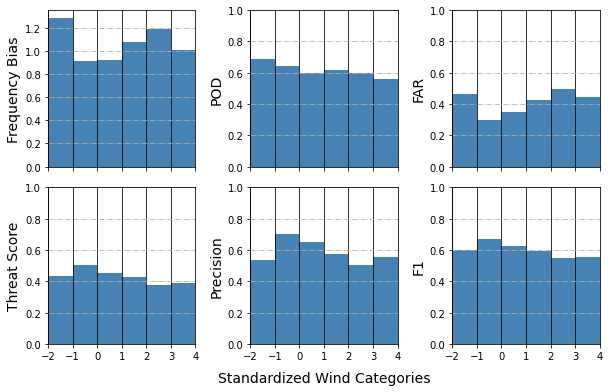

In [508]:
# accuracy scores 

title = ''
labels = ['Frequency Bias', 'POD', 'FAR', 'Threat Score', 'Precision', 'F1']

fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(9,6))
fig.suptitle(title, fontsize=16)
# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel("Standardized Wind Categories", fontsize=14, labelpad=10)

for i, a in enumerate([(0,0),(0,1),(0,2),(1,0),(1,1),(1,2)]):
    ax = axes[a]
    ax.set_xlim(l,r)
    ax.set_xticks(np.arange(l,r+1))
    if i!=0:
        ax.set_ylim(0,1)
    #vals = [np.array(list(scores[cat].values()))[:,i].mean() for cat in scores.keys()]
    vals = [scores[c][i] for c in scores.keys()]
    ax.bar(scores.keys(), vals, align='edge',width=1.,log=False, color='steelblue')
    ax.grid(True,axis='x',color='black')
    ax.grid(True,axis='y',ls='-.')
    ax.set_ylabel(labels[i],fontsize=14)

plt.tight_layout()
#plt.savefig(save_dir+'results_per_cat_%s.png'%title)
plt.show()



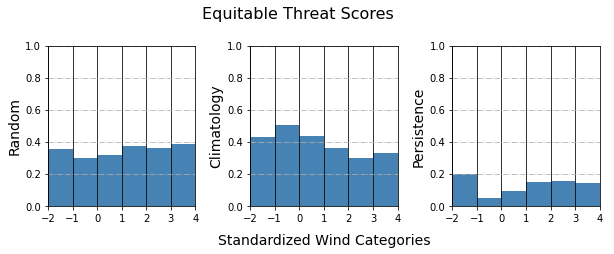

In [509]:
# skill scores 

title = 'Equitable Threat Scores'
labels = ['Random', 'Climatology', 'Persistence']

fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, figsize=(9,3.8))
fig.suptitle(title, fontsize=16)
# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel("Standardized Wind Categories", fontsize=14, labelpad=10)

for i in range(3):
    ax = axes[i]
    ax.set_xlim(l,r)
    ax.set_xticks(np.arange(l,r+1))
    ax.set_ylim(0,1)
    #vals = [np.array(list(scores[cat].values()))[:,i].mean() for cat in scores.keys()]
    vals = [skill_scores[c][i] for c in scores.keys()]
    ax.bar(scores.keys(), vals, align='edge',width=1.,log=False, color='steelblue')
    ax.grid(True,axis='x',color='black')
    ax.grid(True,axis='y',ls='-.')
    ax.set_ylabel(labels[i],fontsize=14)

plt.tight_layout()
#plt.savefig(save_dir+'results_per_cat_%s.png'%title)
plt.show()

In [499]:
error_scores = utils.error_per_cat_per_time(train_loader, test_loader, net, device, args)

In [500]:
#col = plt.cm.hsv(np.linspace(0.75,1.,r-l)) 
col = matplotlib.cm.get_cmap('hsv_r')(np.linspace(0.5,1.,r-l)) 

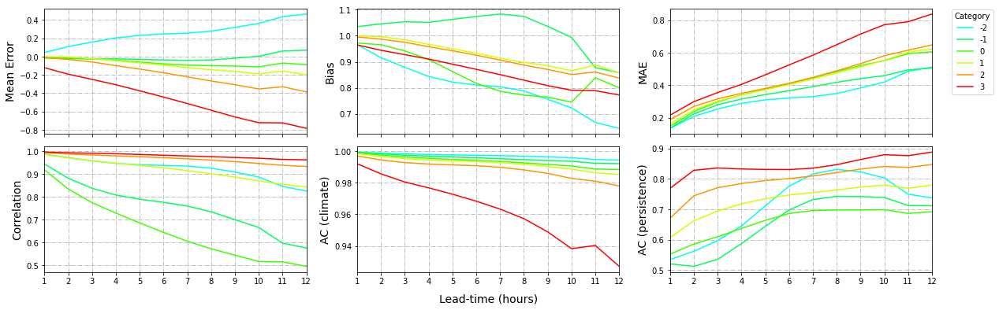

In [501]:
# error scores 

title = ''
labels = ['Mean Error', 'Bias', 'MAE','Correlation','AC (climate)','AC (persistence)']

fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(18,6))
fig.suptitle(title, fontsize=16)
# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel("Lead-time (hours)", fontsize=14, labelpad=10)

for i, a in enumerate([(0,0),(0,1),(0,2),(1,0),(1,1),(1,2)]):
    ax = axes[a]
    ax.set_xlim(1,args.frames_predict)
    ax.set_xticks(np.arange(1,args.frames_predict+1))
    #ax.set_ylim(0,1)
    for j, cat in enumerate(range(l,r)):
        vals = error_scores[i][cat].values()
        ax.plot(np.arange(1,args.frames_predict+1), vals, color=col[j], label=cat)
    ax.grid(True,axis='x',ls='-.')
    ax.grid(True,axis='y',ls='-.')
    if i==2:
        ax.legend(loc='upper right',title="Category",bbox_to_anchor=(1.25, 1.025))
    #ax.set_title(f'Corr: {np.corrcoef(n, list(acc.values()))[1][0]:.2f}')
    #ax.set_xlabel('Forecast time [hours]')
    ax.set_ylabel(labels[i],fontsize=14)

plt.tight_layout()
#plt.savefig(save_dir+'accuracies_per_cat_per_time_%s.png'%title)
plt.show()

In [502]:
scores, skill_scores = utils.accuracy_per_cat_per_time(test_loader, net, device, args)

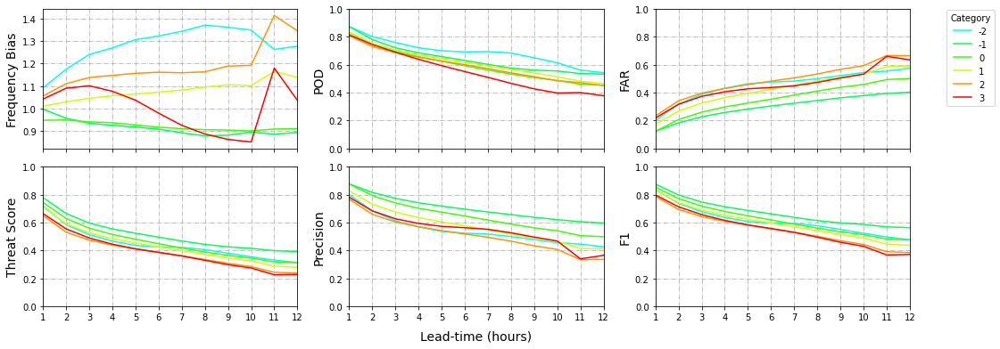

In [503]:
# accuracy scores 

title = ''
labels = ['Frequency Bias', 'POD', 'FAR', 'Threat Score', 'Precision', 'F1']

fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(16,6))
fig.suptitle(title, fontsize=16)
# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel("Lead-time (hours)", fontsize=14, labelpad=10)

for i, a in enumerate([(0,0),(0,1),(0,2),(1,0),(1,1),(1,2)]):
    ax = axes[a]
    ax.set_xlim(1,args.frames_predict)
    ax.set_xticks(np.arange(1,args.frames_predict+1))
    if i != 0:
        ax.set_ylim(0,1)
    for j, cat in enumerate(range(l,r)):
        vals = np.array(list(scores[cat].values()))[:,i]
        ax.plot(np.arange(1,args.frames_predict+1), vals, color=col[j], label=cat)
    ax.grid(True,axis='x',ls='-.')
    ax.grid(True,axis='y',ls='-.')
    if i==2:
        ax.legend(loc='upper right',title="Category",bbox_to_anchor=(1.35, 1.03))
    #ax.set_title(f'Corr: {np.corrcoef(n, list(acc.values()))[1][0]:.2f}')
    #ax.set_xlabel('Forecast time [hours]')
    ax.set_ylabel(labels[i],fontsize=14)

plt.tight_layout()
#plt.savefig(save_dir+'accuracies_per_cat_per_time_%s.png'%title)
plt.show()

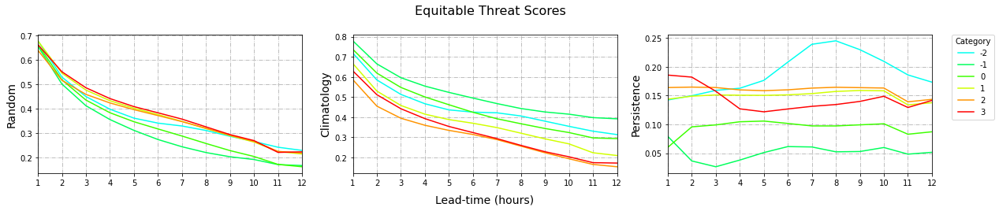

In [504]:
# skill scores 

title = 'Equitable Threat Scores'
labels = ['Random', 'Climatology', 'Persistence']

fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, figsize=(18,4))
fig.suptitle(title, fontsize=16)
# add a big axis, hide frame
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel("Lead-time (hours)", fontsize=14, labelpad=10)

for i in range(3):
    ax = axes[i]
    ax.set_xlim(1,args.frames_predict)
    ax.set_xticks(np.arange(1,args.frames_predict+1))
    #ax.set_ylim(-1,1)
    for j, cat in enumerate(range(l,r)):
        vals = np.array(list(skill_scores[cat].values()))[:,i]
        ax.plot(np.arange(1,args.frames_predict+1), vals, color=col[j], label=cat)
    ax.grid(True,axis='x',ls='-.')
    ax.grid(True,axis='y',ls='-.')
    if i==2:
        ax.legend(loc='upper right',title="Category",bbox_to_anchor=(1.25, 1.03))
    #ax.set_title(f'Corr: {np.corrcoef(n, list(acc.values()))[1][0]:.2f}')
    #ax.set_xlabel('Forecast time [hours]')
    ax.set_ylabel(labels[i],fontsize=14)

plt.tight_layout()
#plt.savefig(save_dir+'accuracies_per_cat_per_time_%s.png'%title)
plt.show()

In [2]:
rels = np.load('../era5/all_relevances.npy')
targets = np.load('../era5/vienna_targets.npy')

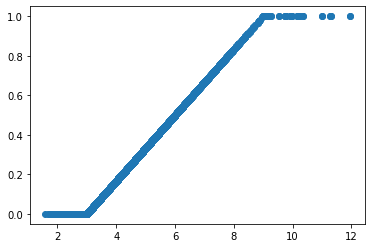

In [3]:
plt.scatter(targets.max(axis=(1,2,3)),rels)

In [5]:
def standardize_local(data):
    zvals = []
    for i in range(data.shape[1]):
        m = data[:,i].mean(0)
        s = data[:,i].std(0)
        zvals.append([m,s])
        for j in range(len(data)):
            data[j,i] = (data[j,i] - m)/s
    return data, zvals
    
def standardize_climate(data):
    plt.figure(figsize=(30,10))
    for yr in range(39):
        plt.scatter(np.arange(365*8), data[yr*365*8:(yr+1)*365*8,0,0,0], marker='o', c='blue', alpha=0.05)
    #plt.savefig('era5/climatology.png')
    plt.close()
    
    #39 years = 113880 time steps 
    zvals = []
    for channel in range(data.shape[1]):
        for i in range(365*8):
            indices = range(i,113880,365*8)
            m = data[indices, channel].mean(0)
            s = data[indices, channel].std(0)
            zvals.append([m,s])
            data[indices, channel] = (data[indices, channel] - m)/s
            
    plt.figure(figsize=(30,10))
    for yr in range(39):
        plt.scatter(np.arange(365*8), data[yr*365*8:(yr+1)*365*8,0,0,0], marker='o', c='blue', alpha=0.05)
    #plt.savefig('era5/climatology_standardized.png')
    plt.close()
    
    return data, zvals

# Storms Only

In [6]:
data = np.load('../era5/adaptor.mars.internal-Horizontal_velocity.npy')
    
data = np.array(data)[:113880]

print('data shape:',data.shape)
print(data.min(), data.max())

data, zvals = standardize_local(data)

print(data.min(), data.max())
print(data.mean(), data.std())

data shape: (113880, 64, 64)
0.00010789593218788873 31.983321659454838
-2.5724363180970276 11.94264251113389
-3.2245529861753583e-16 1.0000000000000004


In [7]:
fl = np.floor(data)
fl.min(), fl.max()

(-3.0, 11.0)

In [8]:
print(sum([i.max()>5 for i in data]))
print(sum([i.max()>5 for i in data])/len(data))

6425
0.05641903758342114


In [9]:
np.any(data[:10].max(axis=(1,2))>4)

True

In [96]:
n = [1.43551400e+06, 1.36710416e+08, 3.82989472e+08, 2.63488108e+08,
        1.10646132e+08, 3.04657970e+07, 5.80339200e+06, 9.23485000e+05,
        1.49476000e+05, 2.53160000e+04, 4.67000000e+03, 8.52000000e+02,
        1.32000000e+02, 4.00000000e+01, 1.40000000e+01]

sum(n[4:])/sum(n)

0.15870953323249531

In [86]:
def get_storm_data(data, train=True):
    threshold = 3.
    new_storm = False
    no_storm = True
    last_storm_index = 0
    last_grabbed_storm = 0 
    last_grabbed_nonstorm= 0
    sliding_window_count = 0
    unique_storm_count = 0
    post_storm = False
    post_storm_wait = 0

    storm_chunks = []
    nonstorm_chunks = []

    for i, grid in enumerate(data):

        if new_storm == True:
            sliding_window_count += 1
            if grid.max() >= threshold:
                last_storm_index = i 
            if sliding_window_count%8==0:
                if not np.any(data[i-31:i-15].max(axis=(1,2))>=threshold): # hard-check
                    storm_chunks.append(data[i-31:i+1])
                    last_grabbed_storm = i 
            if sliding_window_count == 16: 
                # reset
                new_storm = False
                sliding_window_count = 0
            continue 

        #if post_storm == True: 
        #    # wait for 1 day 
        #    post_storm_wait += 1
        #    if post_storm_wait >= 8:
        #        post_storm = False
        #        if grid.max() >= threshold: 
        #            last_nonstorm_index = i+1
        #        else: 
        #            last_nonstorm_index = i 
        #    continue 

        if grid.max() >= threshold:
            last_storm_index = i 
            if i - last_grabbed_storm >= 32: 
                if not np.any(data[i-31:i-15].max(axis=(1,2))>=threshold): # hard-check
                    new_storm = True
                    storm_chunks.append(data[i-31:i+1])
                    sliding_window_count += 1
                    unique_storm_count += 1

            
        else: 
            if i - last_storm_index >= 32 and i - last_grabbed_nonstorm >= 8: 
                #if np.all(data[i-31:i+1].max(axis=(1,2))<threshold): # hard-check
                nonstorm_chunks.append(data[i-31:i+1])
                last_grabbed_nonstorm = i

    return storm_chunks, nonstorm_chunks

In [13]:
113880/16

7117.5

In [27]:
l = len(data)
storm_chunks_train, nonstorm_chunks_train = get_storm_data(data[:int(l*0.5)])
storm_chunks_val, nonstorm_chunks_val = get_storm_data(data[int(l*0.5):int(l*0.75)])
storm_chunks_test, nonstorm_chunks_test = get_storm_data(data[int(l*0.75):])

In [28]:
print(len(storm_chunks_train), len(nonstorm_chunks_train))
print(len(storm_chunks_val), len(nonstorm_chunks_val))
print(len(storm_chunks_test), len(nonstorm_chunks_test))

print('\n')
a, b = 0.75, 0.75
print(int(len(storm_chunks_train)*a)+int(len(nonstorm_chunks_train)*b))
print(int(len(storm_chunks_val)*a)+int(len(nonstorm_chunks_val)*b))
print(int(len(storm_chunks_test)*a)+int(len(nonstorm_chunks_test)*b))

735 348
299 110
311 129


812
306
329


In [165]:
len(storm_chunks)/3

1073.0

In [166]:
np.array(storm_chunks_train[:])[:,:16].max()

5.73109950772983

In [34]:
print(max([i.max() for i in storm_chunks_train]))

print(max([i.max() for i in np.array(storm_chunks_train)[:,:16]]))

print(max([i.max() for i in nonstorm_chunks_train]))

8.293511656500145
2.9997628972710824
2.9997628972710824


In [18]:
#nonstorm_chunks_train[0]

In [129]:
def plot_all_frames(input, target):

    cmap = 'jet'
    vmin, vmax = -2,2
    
    title_list = ['Input',
                  'Target Output',
                  'Predicted Output']
    
    fig, big_axes = plt.subplots(figsize=(24, 6), nrows=2, ncols=1, sharey=True)
    plt.tight_layout()
    for i, big_ax in enumerate(big_axes):
        big_ax.set_title(title_list[i], fontsize=16, x=-0.05, y=0.5)
        # Turn off axis lines and ticks of the big subplot 
        # obs alpha is 0 in RGBA string!
        #big_ax.tick_params(labelcolor=(1.,1.,1., 0.0), top='off', bottom='off', left='off', right='off')
        # removes the white frame
        big_ax._frameon = False
        big_ax.get_xaxis().set_visible(False)
        big_ax.get_yaxis().set_visible(False)
    
    for i in range(1,17):
        ax = fig.add_subplot(2,16,i)
        ax.set_aspect('equal')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        ax.imshow(input[i-1], cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_title(f'{input[i-17].max():.1f}',x=0.5, y=-0.23)
    
    for i in range(17,33):
        ax = fig.add_subplot(2,16,i)
        ax.set_aspect('equal')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        ax.imshow(target[i-17], cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_title(f'{target[i-17].max():.1f}',x=0.5, y=-0.23)
    
    fig.set_facecolor('w')
    plt.tight_layout()

    plt.subplots_adjust(left=0.01,
                    bottom=0.01, 
                    right=0.99, 
                    top=0.99, 
                    wspace=0.1, 
                    hspace=-0.6)

    plt.show()
    
    return

In [125]:
import scipy
frames = np.array(storm_chunks_train)[:,16:]>1.
for i in range(frames.shape[0]):
    for t in range(frames.shape[1]):
        #frames[i,t] = scipy.ndimage.filters.gaussian_filter(frames[i,t], 0.2)
        #frames[i,t] = scipy.ndimage.filters.maximum_filter(frames[i,t], (5,5))
        frames[i,t] = scipy.ndimage.filters.median_filter(frames[i,t], (5,5))
        #frames[i,t] = scipy.ndimage.filters.minimum_filter(frames[i,t], (2,2))
print(frames.shape)

(735, 16, 64, 64)


0


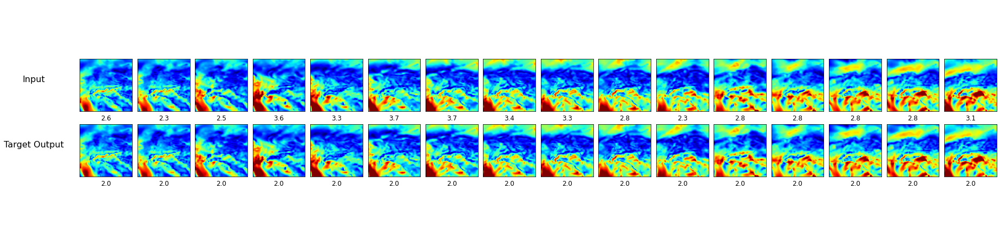

1


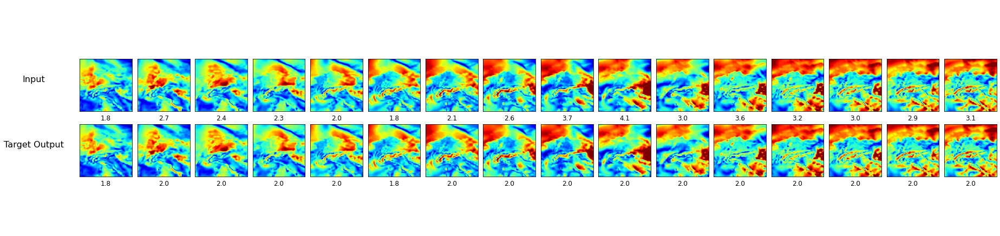

2


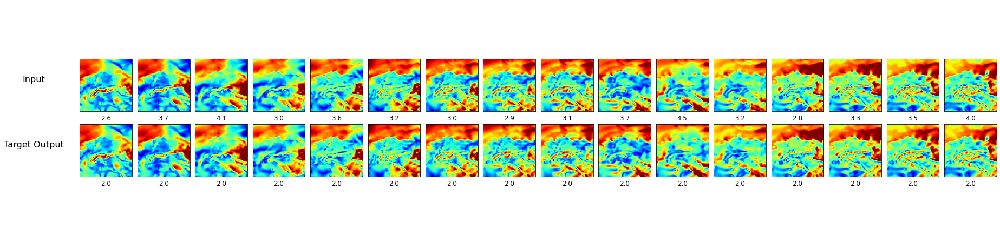

3


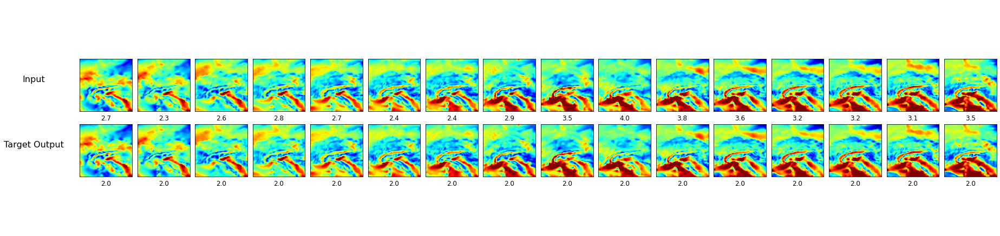

4


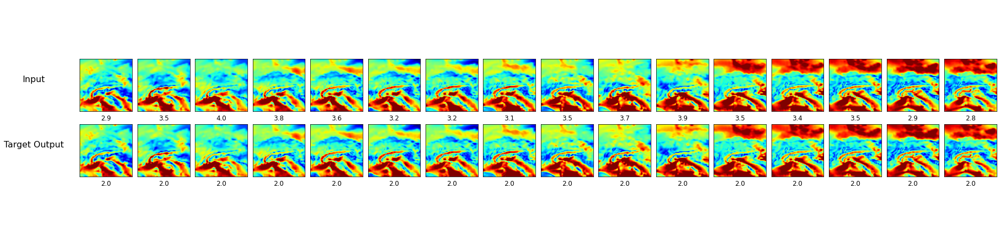

5


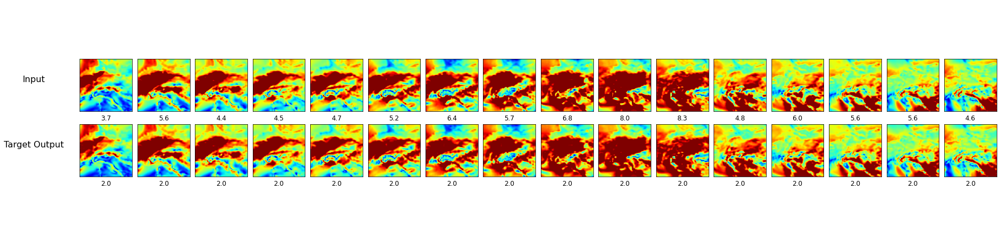

6


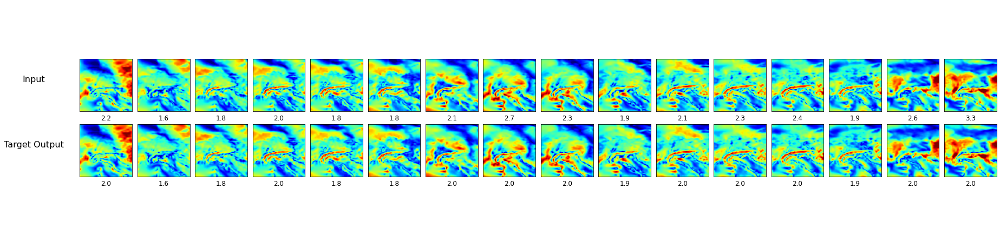

7


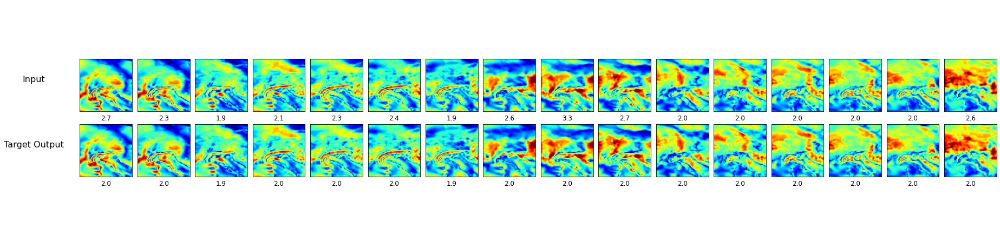

8


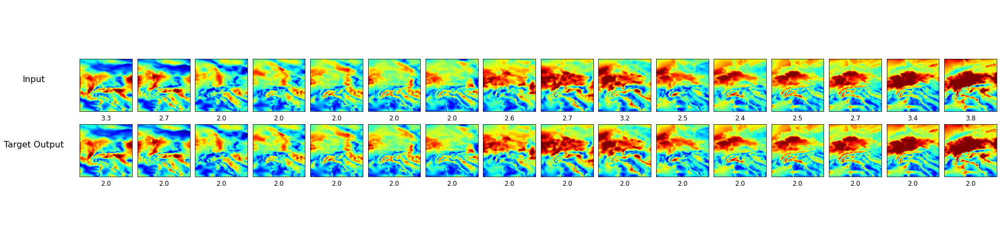

9


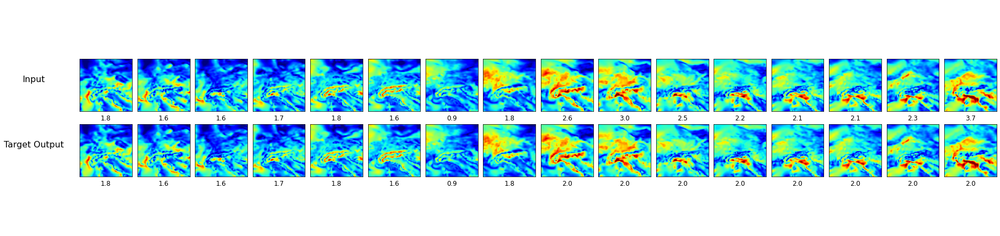

In [131]:
s = np.array(storm_chunks_train)[:,16:]
s[s<-2.]=-2.
s[s>2.]=2.

for i in range(10):
    print(i)
    plot_all_frames(storm_chunks_train[i][16:],s[i])

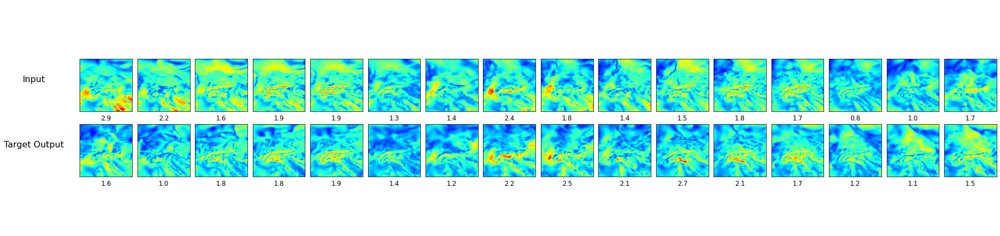

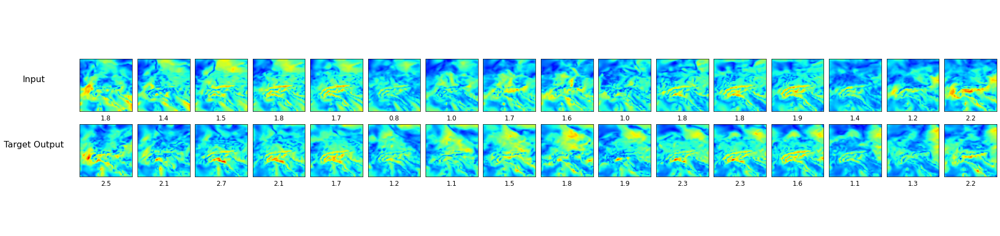

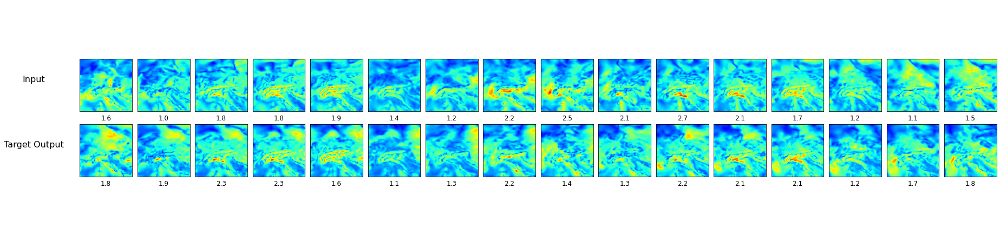

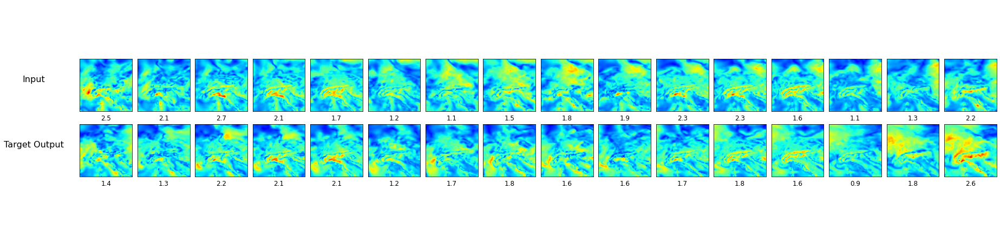

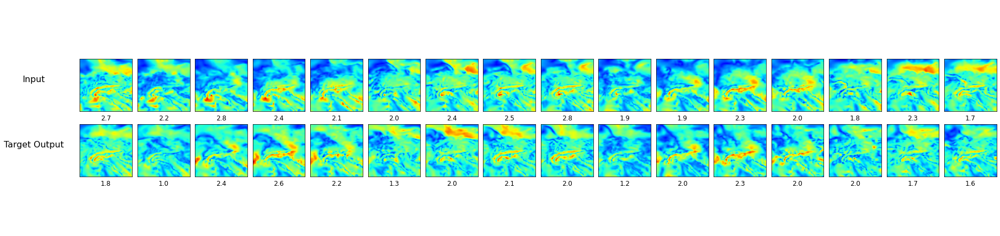

...

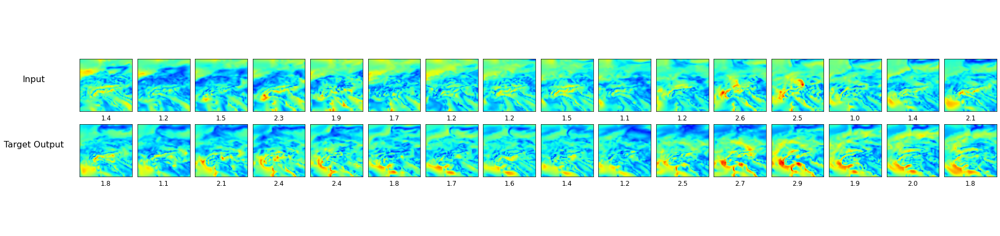

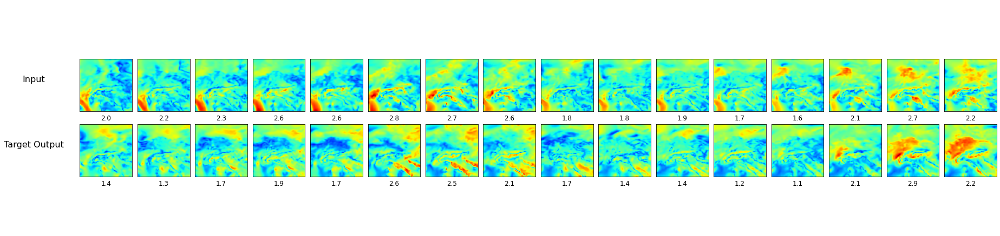

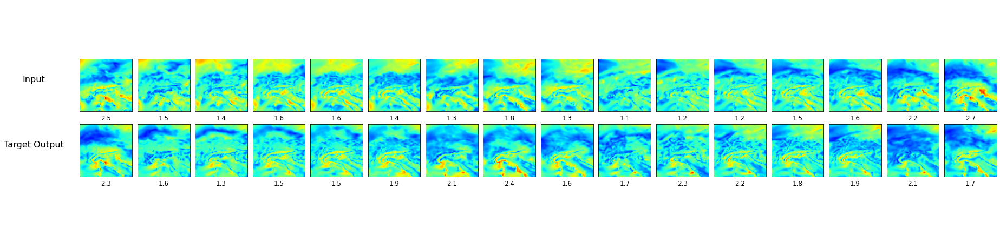

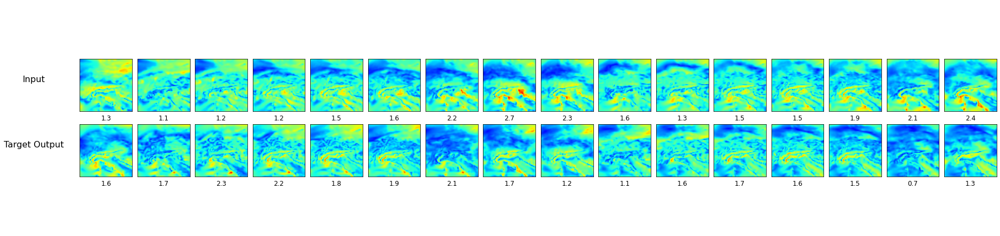

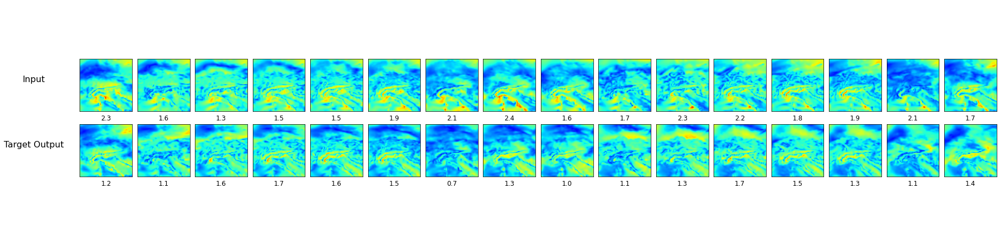

In [38]:
for i in range(20):
    plot_all_frames(nonstorm_chunks_train[i][:16],nonstorm_chunks_train[i][16:])

In [ ]:
def get_storm_data(data):
    threshold = 3.
    new_storm = False
    no_storm = True
    last_storm_index = 0
    last_grabbed_storm = 0 
    last_grabbed_nonstorm= 0
    sliding_window_count = 0
    unique_storm_count = 0
    post_storm = False
    post_storm_wait = 0

    storm_chunks = []
    nonstorm_chunks = []

    for i, grid in enumerate(data):

        if new_storm == True:
            sliding_window_count += 1
            if grid.max() >= threshold:
                last_storm_index = i 
            if sliding_window_count%8==0:
                if not np.any(data[i-31:i-15].max(axis=(1,2))>=threshold): # hard-check
                    storm_chunks.append(data[i-31:i+1])
                    last_grabbed_storm = i 
            if sliding_window_count == 16: 
                # reset
                new_storm = False
                sliding_window_count = 0
            continue 

        #if post_storm == True: 
        #    # wait for 1 day 
        #    post_storm_wait += 1
        #    if post_storm_wait >= 8:
        #        post_storm = False
        #        if grid.max() >= threshold: 
        #            last_nonstorm_index = i+1
        #        else: 
        #            last_nonstorm_index = i 
        #    continue 

        if grid.max() >= threshold:
            last_storm_index = i 
            if i - last_grabbed_storm >= 32: 
                if not np.any(data[i-31:i-15].max(axis=(1,2))>=threshold): # hard-check
                    new_storm = True
                    storm_chunks.append(data[i-31:i+1])
                    sliding_window_count += 1
                    unique_storm_count += 1

            
        else: 
            if i - last_storm_index >= 32 and i - last_grabbed_nonstorm >= 8: 
                #if np.all(data[i-31:i+1].max(axis=(1,2))<threshold): # hard-check
                nonstorm_chunks.append(data[i-31:i+1])
                last_grabbed_nonstorm = i

    return storm_chunks, nonstorm_chunks

## Check inputs, targets 

In [32]:
    data = np.load(os.path.join(data_root, 'chunked_inputs.npy'))
    targets = np.load(os.path.join(data_root, 'chunked_targets.npy'))   
    cats = np.load(os.path.join(data_root, 'chunked_cats.npy'))  
    print('data shape:',data.shape)
    print('targets shape:',targets.shape)
    print('cats shape:',cats.shape)
    
    #print('\nclass counts:')
    #classes, counts = torch.unique(torch.from_numpy(cats).float(), sorted=True, return_inverse=False, return_counts=True)
    #for c, count in zip(classes, counts):
    #    print(f'class: {c:.1f}\t count: {count}   \t percent: {count/counts.sum()*100:.3f}')
    
    n = len(data)
    
    train_inputs = torch.from_numpy(data[:int(n*0.5),:]).float()
    val_inputs = torch.from_numpy(data[int(n*0.5):int(n*0.75),:]).float()
    test_inputs = torch.from_numpy(data[int(n*0.75):,:]).float()
    
    train_targets = torch.from_numpy(targets[:int(n*0.5),:args.frames_predict]).float()
    val_targets = torch.from_numpy(targets[int(n*0.5):int(n*0.75),:args.frames_predict]).float()
    test_targets = torch.from_numpy(targets[int(n*0.75):,:args.frames_predict]).float()
    
    train_cats = torch.from_numpy(cats[:int(n*0.5),:args.frames_predict]).long()
    val_cats = torch.from_numpy(cats[int(n*0.5):int(n*0.75),:args.frames_predict]).long()
    test_cats = torch.from_numpy(cats[int(n*0.75):,:args.frames_predict]).long()

data shape: (14231, 16, 1, 64, 64)
targets shape: (14231, 16, 64, 64)
cats shape: (14231, 16, 64, 64)


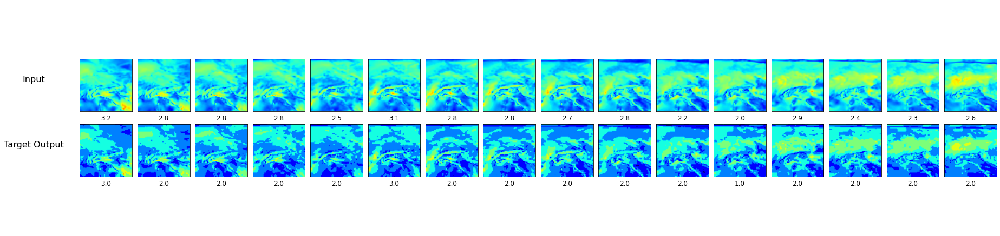

In [40]:
plot_all_frames(data[2,:,0], cats[0])

In [30]:
data = np.load(os.path.join(data_root, 'chunked_inputs.npy'))
targets = np.load(os.path.join(data_root, 'chunked_targets.npy'))   
cats = np.load(os.path.join(data_root, 'chunked_cats.npy'))  
print('data shape:',data.shape)
print('targets shape:',targets.shape)
print('cats shape:',cats.shape)

data shape: (14231, 16, 1, 64, 64)
targets shape: (14231, 16, 64, 64)
cats shape: (14231, 16, 64, 64)


In [32]:
cats.max()

11

# Haar Wavelet Decomposition 

In [12]:
import pywt

In [122]:
framep = pred[147][11]
framet = targets[147][11]

In [123]:
threshold=2.7
framep = framep>threshold
framet = framet>threshold
dif = np.array(framet,dtype=int)-np.array(framep,dtype=int)

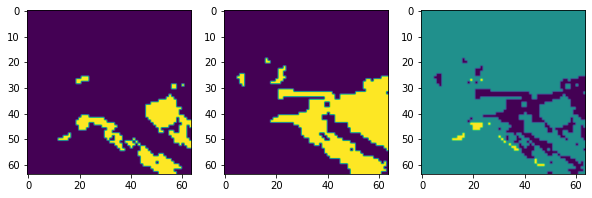

In [124]:
fig, ax = plt.subplots(1,3,figsize=(10,5))
ax[0].imshow(framet)
ax[1].imshow(framep)
ax[2].imshow(dif)
plt.show()

In [125]:
def clip_frame(frame):
    frame2 = frame.copy()
    frame2[frame<-0.1]  = -1
    frame2[frame>=-0.1] = 0 
    frame2[frame>0.1]   = 1
    return frame2 

In [227]:
for i in range(7):
    print(int((i+1)*2/4), (i+1)%2)

0 1
1 0
1 1
2 0
2 1
3 0
3 1


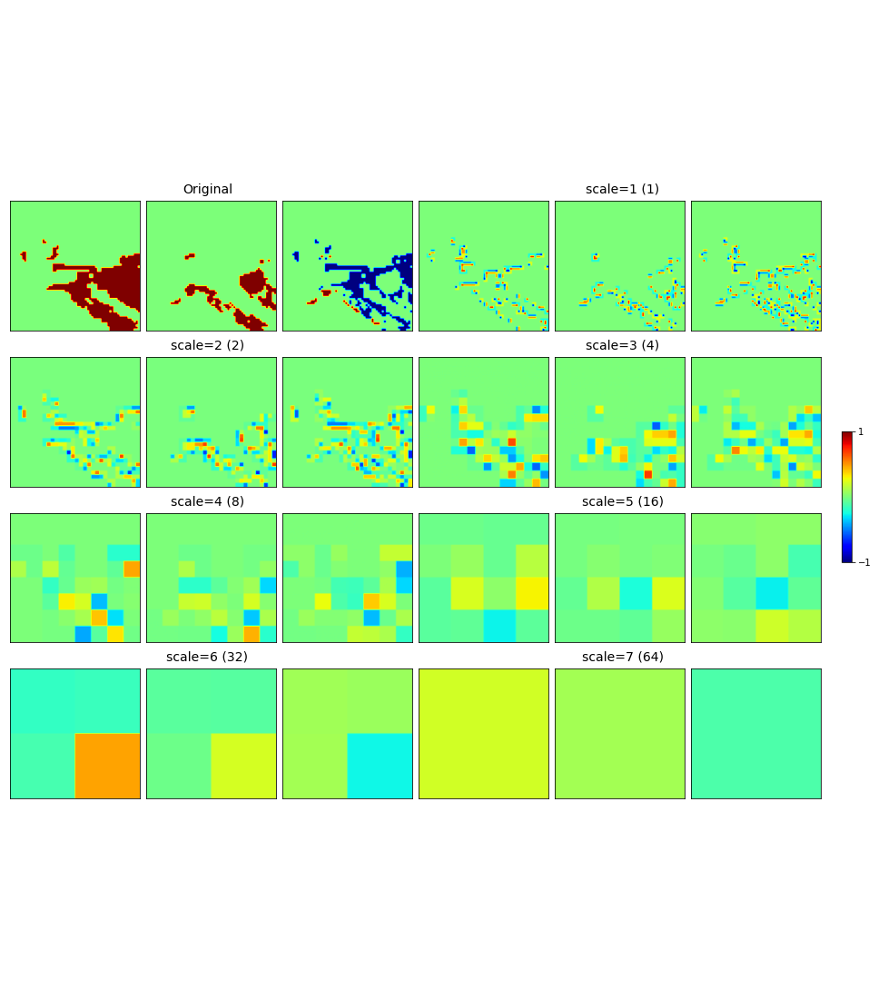

[0.2384583  0.36538192 0.53186875 0.59548118 0.70790749 0.41442173
 0.65045798]
[0.2384583  0.36538192 0.53186875 0.59548118 0.70790749 0.41442173
 0.65045798]


In [292]:
cmap='jet'
vmin=-1
vmax=1

MSE = np.zeros((7))
Et = 0
Ep = 0

fig, axes = plt.subplots(4,2,figsize=(16,20))
#for i, big_ax in enumerate(axes):
#    big_ax._frameon = False
#    big_ax.get_xaxis().set_visible(False)
#    big_ax.get_yaxis().set_visible(False)

count=0

ax = axes[0,0]
ax.set_title('Original', fontsize=14, y=0.63)
ax._frameon = False
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

count+=1
ax = fig.add_subplot(4, 6, count)
ax.imshow(framep, cmap=cmap, vmin=vmin, vmax=vmax)
ax.set_xticks([])
ax.set_yticks([])
count+=1
ax = fig.add_subplot(4, 6, count)
ax.imshow(framet, cmap=cmap, vmin=vmin, vmax=vmax)
ax.set_xticks([])
ax.set_yticks([])
count+=1
ax = fig.add_subplot(4, 6, count)
ax.imshow(dif, cmap=cmap, vmin=vmin, vmax=vmax)
ax.set_xticks([])
ax.set_yticks([])


#counts = utils.get_counts_from_binary(pred.reshape(-1,64,64)>threshold, targets.reshape(-1,64,64)>threshold) # for r and s 
counts = utils.get_counts_from_binary(framep, framet) # for r and s 

tot = counts['tp']+counts['fp']+counts['fn']+counts['tn'] # a + b + c + d 
r = (counts['tp']+counts['fp'])/tot # (a + b)/n
s = (counts['tp']+counts['fn'])/tot # (a + c)/n

B = r/s  
MSE_rand = (B*s*(1-s)+s*(1-B*s))/7

ct = pywt.wavedec2(framet, wavelet='haar')
cp = pywt.wavedec2(framep, wavelet='haar')

for i, s in enumerate(np.arange(6,-1,-1)):
    ct_copy, cp_copy = ct.copy(), cp.copy()
    for j in range(7):
        if j!=s:
            ct_copy[j] = tuple([np.zeros_like(v) for v in ct_copy[j]])
            cp_copy[j] = tuple([np.zeros_like(v) for v in cp_copy[j]])

    rec_t = pywt.waverec2(ct_copy, wavelet='haar')
    rec_p = pywt.waverec2(cp_copy, wavelet='haar')

    Et += (rec_t**2).mean()
    Ep += (rec_p**2).mean()
    MSE[i] = ((rec_t-rec_p)**2).mean()

    ax = axes[int((i+1)*2/4), (i+1)%2]
    ax.set_title('scale=%s (%s)'%(i+1, [1,2,4,8,16,32,64][i]), fontsize=14, y=0.63)
    ax._frameon = False
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    count+=1
    ax = fig.add_subplot(4, 6, count)
    ax.imshow((rec_p), cmap=cmap, vmin=vmin, vmax=vmax)
    #if i==0:
    #    ax.set_title('Prediction', fontsize=14, pad=10)
    ax.set_xticks([])
    ax.set_yticks([])
    
    count+=1
    ax = fig.add_subplot(4, 6, count)
    im = ax.imshow((rec_t), cmap=cmap, vmin=vmin, vmax=vmax)
    #if i==0:
    #    ax.set_title('Target', fontsize=14, pad=10)
    ax.set_xticks([])
    ax.set_yticks([])
    if (int((i+1)*2/4), (i+1)%2)==(1,1):
        im_ = im
    
    count+=1
    ax = fig.add_subplot(4, 6, count)
    ax.imshow((rec_t-rec_p), cmap=cmap, vmin=vmin, vmax=vmax)
    #if i==0:
    #    ax.set_title('Difference', fontsize=14, pad=10)
    ax.set_xticks([])
    ax.set_yticks([])
        
#plt.tight_layout()
cbar_ax = fig.add_axes([0.92, 0.455, 0.01, 0.1])
cbar = fig.colorbar(im_, cax=cbar_ax, ticks=[-1,1])

plt.subplots_adjust(wspace=0.05, hspace=-0.7)
plt.savefig(data_root + 'IS_example.png')
plt.show()


SS = np.array(1-MSE/MSE_rand)
print(SS)

B = Ep/Et
MSE_rand = (B*Et*(1-Et)+Et*(1-B*Et))/7
SS = np.array(1-MSE/MSE_rand)
print(SS)

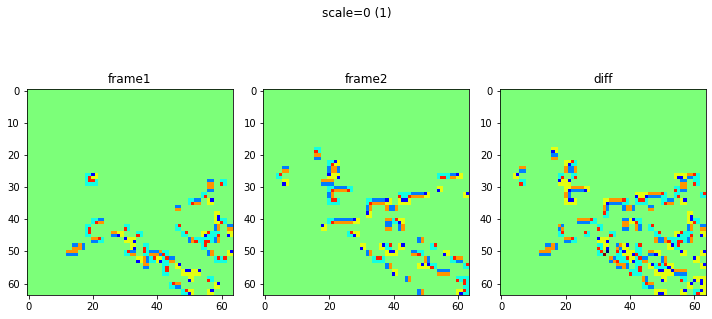

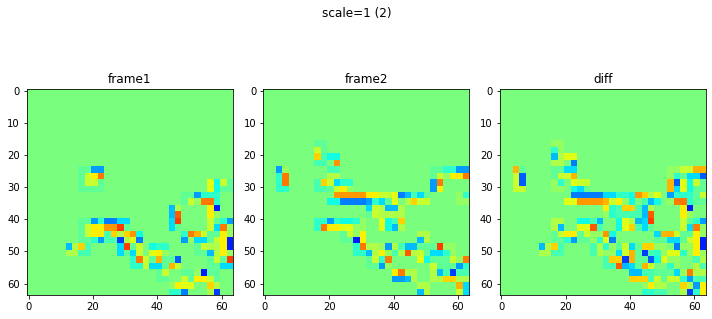

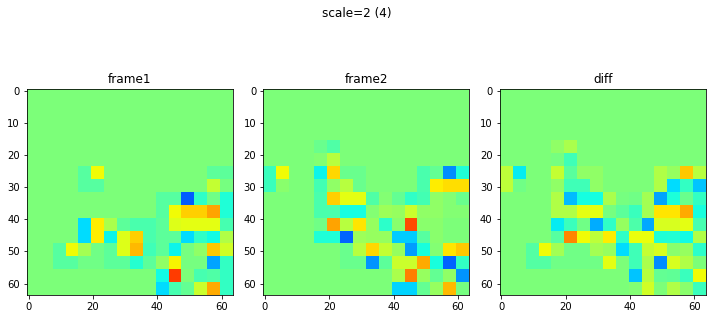

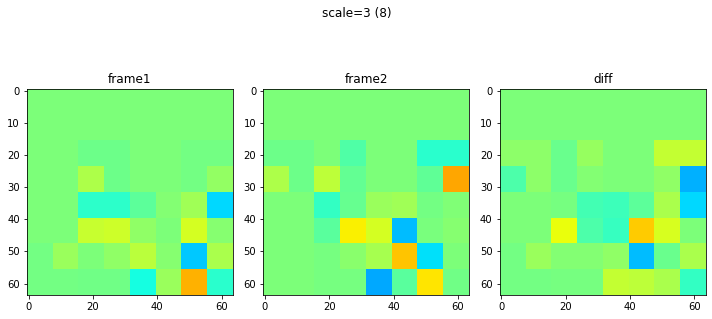

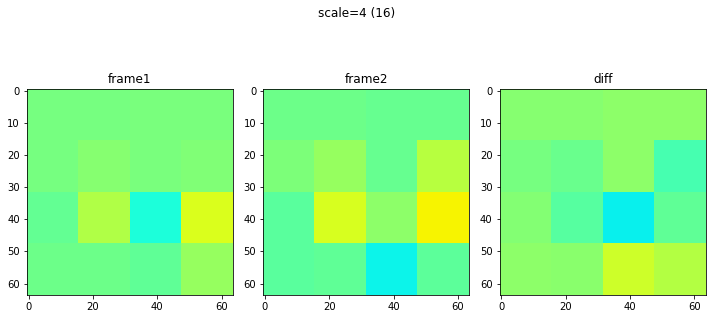

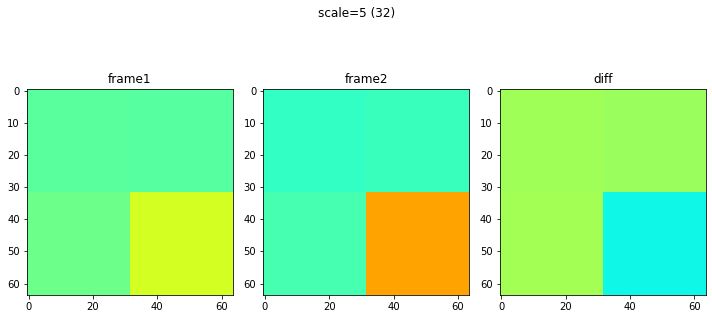

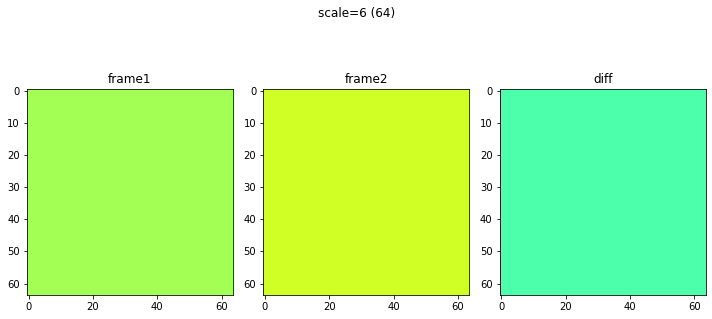

In [166]:
cmap='jet'
vmin=-1
vmax=1

Et = 0
Ep = 0

MSE = np.zeros(7)

cot = pywt.wavedec2(framet, wavelet='haar')
cop = pywt.wavedec2(framep, wavelet='haar')
cod = pywt.wavedec2(dif, wavelet='haar')
    
for s, i in enumerate(np.arange(6,-1,-1)):
    cot_copy, cop_copy, cod_copy = cot.copy(), cop.copy(), cod.copy()
    for j in range(7):
        if j!=i:
            cot_copy[j] = tuple([np.zeros_like(v) for v in cot_copy[j]])
            cop_copy[j] = tuple([np.zeros_like(v) for v in cop_copy[j]])
            cod_copy[j] = tuple([np.zeros_like(v) for v in cod_copy[j]])
            
    rest = pywt.waverec2(cot_copy, wavelet='haar')
    resp = pywt.waverec2(cop_copy, wavelet='haar')
    #resd = pywt.waverec2(cod_copy, wavelet='haar')
    resd2 = rest-resp 

    Et += (rest**2).mean()
    Ep += (resp**2).mean()
    
    MSE[s] = (resd2**2).mean()
    
    
    
    
    fig, ax = plt.subplots(1,3,figsize=(10,5))
    
    ax[0].imshow((rest), cmap=cmap, vmin=vmin, vmax=vmax)
    ax[1].imshow((resp), cmap=cmap, vmin=vmin, vmax=vmax)
    #ax[2].imshow(clip_frame(resd))
    ax[2].imshow((resd2), cmap=cmap, vmin=vmin, vmax=vmax)
    
    ax[0].set_title('frame1')
    ax[1].set_title('frame2')
    #ax[2].set_title('diff')
    ax[2].set_title('diff')
    
    fig.suptitle('scale=%s (%s)'%(s, [1,2,4,8,16,32,64][s]))
    plt.tight_layout()
    plt.show()


In [156]:
MSE

array([0.02893066, 0.02410889, 0.01778412, 0.01536751, 0.01109648,
       0.02224588, 0.01327896])

In [92]:
B = Ep/Et
MSE_rand = (B*Et*(1-Et)+Et*(1-B*Et))/7

In [93]:
SS = 1-MSE/MSE_rand
SS

array([0.2384583 , 0.36538192, 0.53186875, 0.59548118, 0.70790749,
       0.41442173, 0.65045798])

In [113]:
SS = utils.compute_IS(targets, pred, [4.0], args, categorical=False, time_comp=False)

In [114]:
SS

array([[ 0.9209316 ,  0.86896311,  0.70531039,  0.50033649,  0.20419703,
        -0.07532442, -0.5680856 ]])